# Installations

In [ ]:
!pip install datasets

In [ ]:
!pip install transformers

In [ ]:
!pip install shap

# Imports

In [7]:
from transformers import AutoImageProcessor, Swinv2ForImageClassification
from datasets import load_dataset
import shap
from PIL import Image
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
%matplotlib inline

# ImageNet50

In [8]:
X, y = shap.datasets.imagenet50()

In [9]:
path = "/content/drive/MyDrive/ImageNet50" # change path

for i in range(50):
  im = Image.fromarray(np.uint8(X[i]))
  im.save(f"{path}/im_{i}.png")

# Setting up preprocessor and model

In [14]:
# ref: https://huggingface.co/docs/transformers/model_doc/swinv2
# image_processor = AutoImageProcessor.from_pretrained("microsoft/swinv2-tiny-patch4-window8-256")
# model = Swinv2ForImageClassification.from_pretrained("microsoft/swinv2-tiny-patch4-window8-256")

# microsoft/swinv2-base-patch4-window12to16-192to256-22kto1k-ft

image_processor = AutoImageProcessor.from_pretrained("microsoft/swinv2-base-patch4-window12to16-192to256-22kto1k-ft")
model = Swinv2ForImageClassification.from_pretrained("microsoft/swinv2-base-patch4-window12to16-192to256-22kto1k-ft")


Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


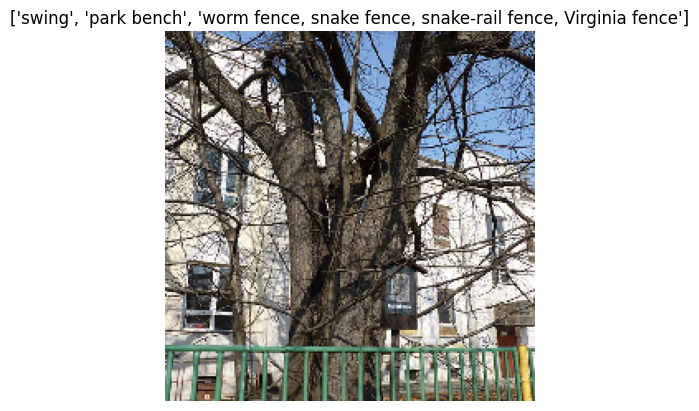

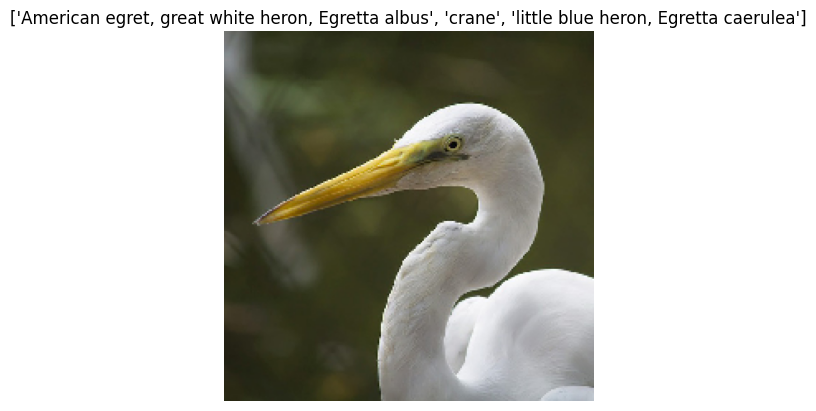

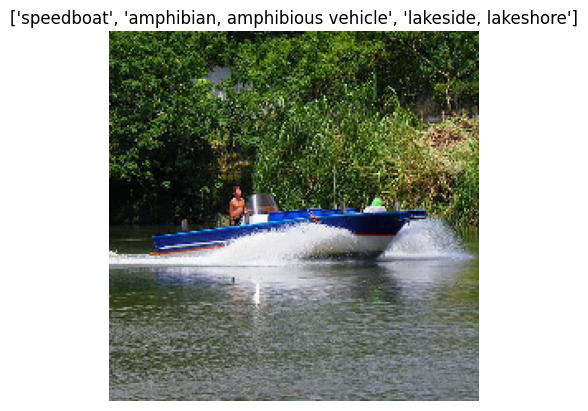

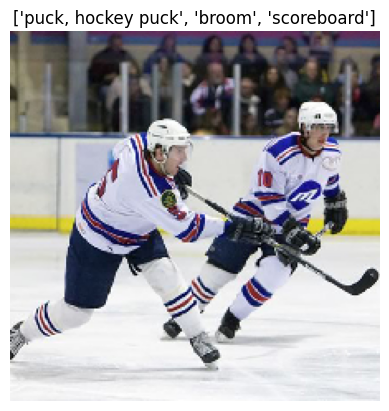

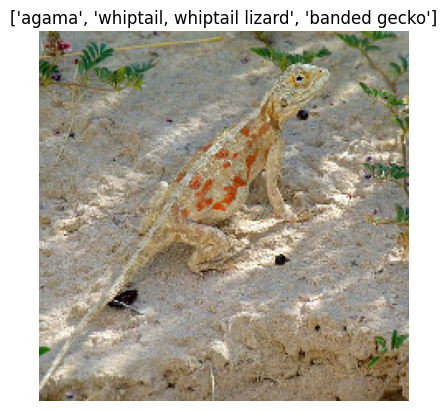

...

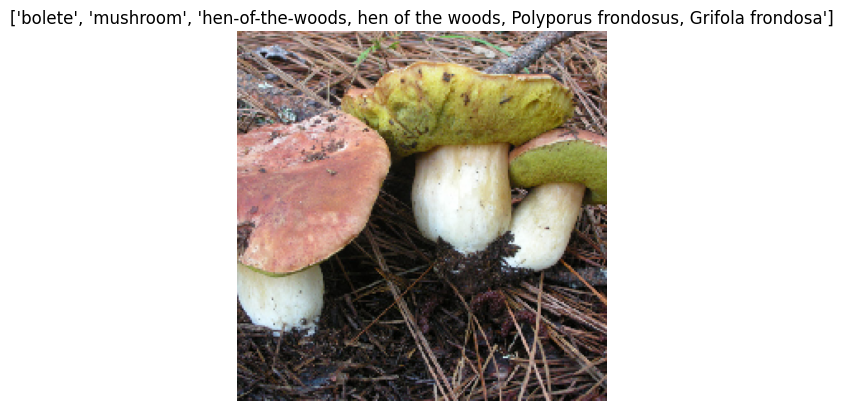

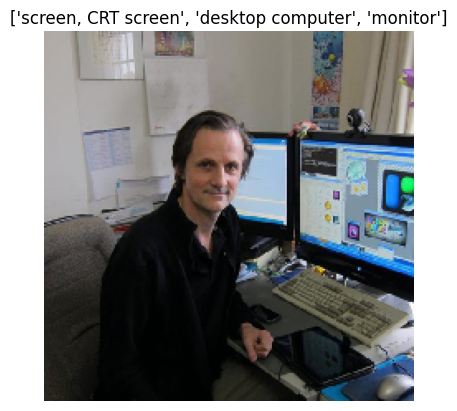

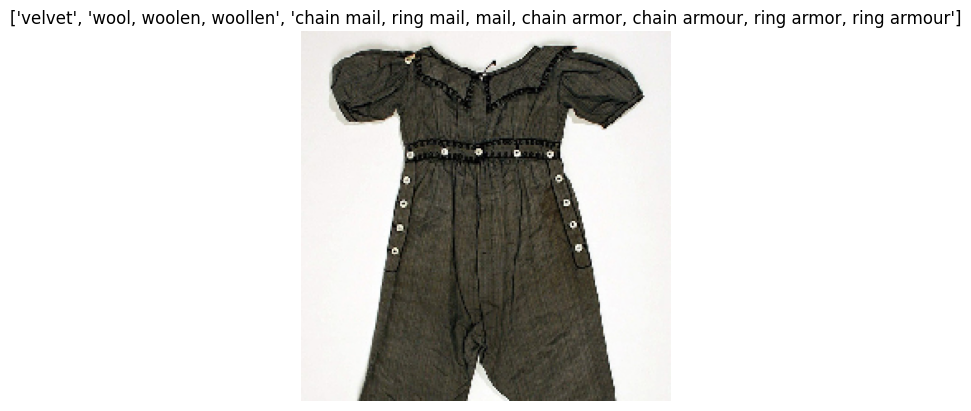

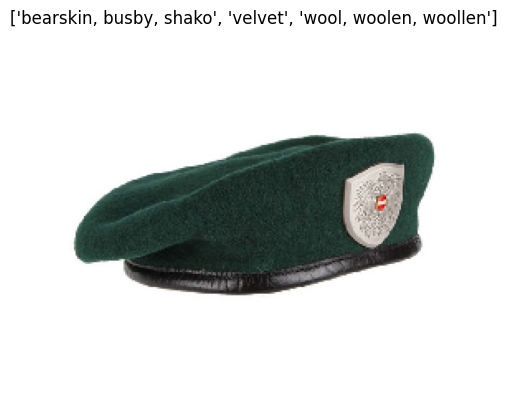

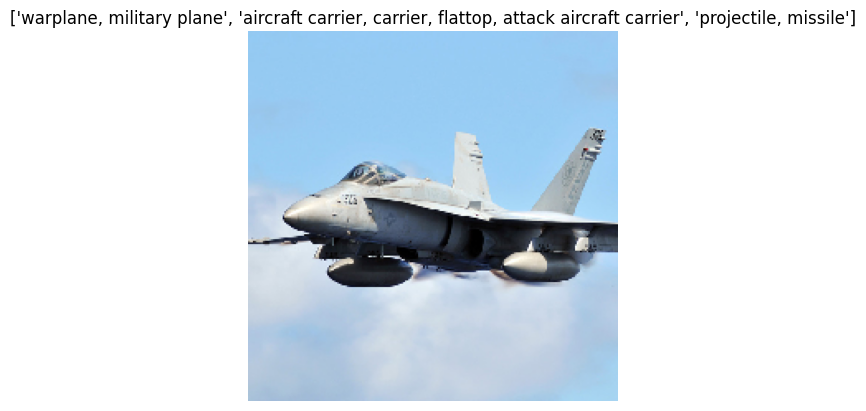

In [15]:
preds = []


for i in range(50):
  im_path = path + f"/im_{i}.png"
  img = Image.open(im_path).convert('RGB')
  # print(type(img))

  inputs = image_processor(img, return_tensors="pt")

  with torch.no_grad():
    logits = model(**inputs).logits

  predicted_label = logits.argmax(-1).item()

  top_3 = torch.topk(logits.flatten(), 3).indices
  
  top_3_labels = [model.config.id2label[i.item()] for i in top_3]
  # p = model.config.id2label[predicted_label]
  # plt.title(p)
  plt.title(top_3_labels)
  plt.axis("off")
  plt.imshow(img)
  plt.savefig(f"{path}/preds/im_{i}.png", bbox_inches='tight')
  plt.show()